In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
#import celltypist
import scvelo as scv
#from celltypist import models
import seaborn as sns
import matplotlib.pyplot as plt

from matplotlib.pyplot import rc_context

sc.set_figure_params(dpi=100, color_map = 'viridis_r', transparent=False, frameon=False)
sc.settings.verbosity = 1
sc.logging.print_header()

version = '2023-05-16'

sc.settings.figdir = './scanpy/{}/graph'.format(version)
sc.settings.cachedir = './scanpy/{}/cache'.format(version)
%config InlineBackend.figure_format = 'retina'

# matplot 输出的图片为illustrator可编辑的字体
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.22.0 scipy==1.9.3 pandas==1.5.1 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.10.2 louvain==0.8.0 pynndescent==0.5.7


# Data

In [2]:
adata_MC = sc.read('./write/MC_leiden.h5ad')
adata_MC.uns['log1p']["base"] = None
adata_MC

AnnData object with n_obs × n_vars = 33577 × 19590
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Phenotype', 'donor_id', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'predicted_labels_NC2022', 'majority_voting_NC2022', 'predicted_labels_builtin', 'majority_voting_builtin', 'leiden', 'Major_cluster', 'Sample', 'Minor_cluster', 'Major_category'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Major_category_colors', 'Major_cluster_colors', 'Minor_cluster_colors', 'Phenotype_colors', 'donor_id_colors', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_NC2022_colors', 'majority_voting_builtin_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'counts', 'matrix', 'spli

## Export h5 to seurat (for processing cell chating in R)

In [35]:
import diopy

diopy.output.write_h5(adata_MC, file = 'MC_leiden.h5')

## Minor_cluster annotation

In [4]:
subcell_annotator_M =  pd.read_csv('./adata_MC_Mono.obs.csv', index_col=0)[['Minor_cluster']]
subcell_annotator_T =  pd.read_csv('./adata_MC_T.obs.csv', index_col=0)[['Minor_cluster']]
subcell_annotator_B =  pd.read_csv('./adata_MC_B.obs.csv', index_col=0)[['Minor_cluster']]

# concat all subcellular annotator

pdList = [subcell_annotator_M, subcell_annotator_B, subcell_annotator_T]  
subcell_annotator = pd.concat(pdList)
subcell_annotator

,Minor_cluster
AAACCTGAGAATGTGT-0,Monocytes 1
AAACCTGAGCGCCTCA-0,Monocytes 2
AAACCTGAGGCTAGCA-0,Monocytes 1
AAACCTGAGGTGGGTT-0,Monocytes 1
AAACCTGCACAAGTAA-0,Monocytes 2
...,...
TTTGTCAAGAAGATTC-3,CD4 Tcm (Th0)
TTTGTCAAGGTGGGTT-3,CD8 Tem
TTTGTCACAAGAAGAG-3,Activated Treg
TTTGTCAGTTATCCGA-3,CD4 Tcm (Th0)


In [5]:
adata_MC.obs['Minor_cluster'] = adata_MC.obs['Major_cluster']
adata_MC.obs['Minor_cluster'] = subcell_annotator['Minor_cluster'].combine_first(adata_MC.obs['Minor_cluster'])
adata_MC.obs['Minor_cluster'].unique().tolist()

['Monocytes 1',
 'Monocytes 2',
 'NK cells',
 'CD8 Tem',
 'Monocytes 3',
 'Megakaryocytes',
 'CD4 Temra (Th1)',
 'CD4 Tcm (Th0)',
 'CD4 Tcm (Th17)',
 'Activated Treg',
 'Naive B',
 'CD4 Tnaive',
 'Plasma cells',
 'CD8 Tnaive',
 'Monocytes 4',
 'Naive Treg',
 'Memory B',
 'CD4 Tcm (Th2)',
 'Age-associated B',
 'Neutrophils',
 'DC2',
 'CD4 Tem (Th1)',
 'Neutrophil-myeloid progenitor',
 'HSC/MPP',
 'CD4 Tem (Th1/17)']

In [6]:
def set_Major_category(x):
    if x in ['Monocytes 1', 'Monocytes 4', 'Monocytes 2', 'Monocytes 3']:
        return 'M'
    elif x in ['Naive B', 'Plasma cells', 'Memory B','Age-associated B']:
        return "B"
    elif x in ['CD8 Tem', 'CD4 Temra (Th1)', 'CD4 Tcm (Th0)', 'CD4 Tcm (Th17)', 'Activated Treg','CD4 Tnaive','CD8 Tnaive','Naive Treg', 'CD4 Tcm (Th2)','CD4 Tem (Th1)', 'CD4 Tem (Th1/17)']:
        return "T"    
    elif x in ['NK cells']:
        return "NK"
    elif x in ['Neutrophils', 'NK cells','Megakaryocytes', 'DC2', 'HSC/MPP', 'Neutrophil-myeloid progenitor']:
        return "Other"


adata_MC.obs["Major_category"] = adata_MC.obs["Minor_cluster"].apply(set_Major_category)
adata_MC.obs["Major_category"].unique().tolist()

['M', 'NK', 'T', 'Other', 'B']

In [7]:
adata_MC.write('./write/MC_leiden.h5ad')

# Overview

meta NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped


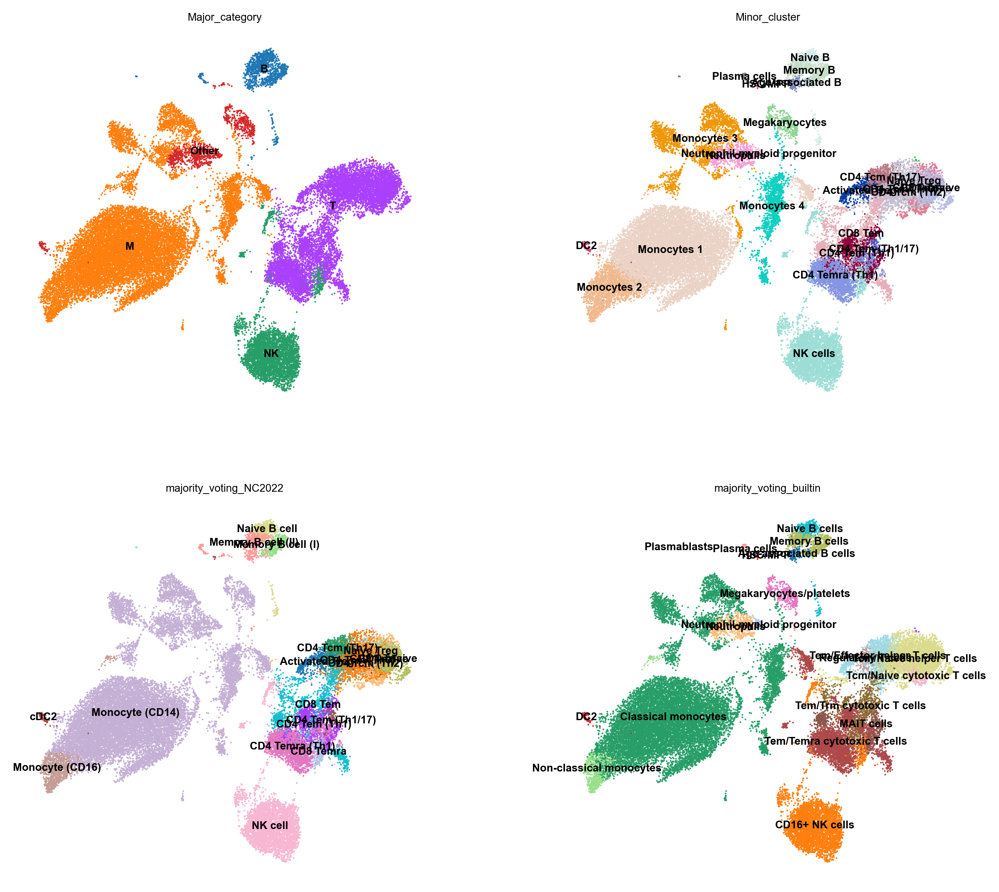

In [23]:
sc.set_figure_params(dpi=200, color_map = 'viridis_r', fontsize=6, transparent=True, frameon=False)

sc.pl.umap(adata_MC, color=['Major_category', 'Minor_cluster','majority_voting_NC2022', 'majority_voting_builtin'], legend_loc = 'on data', save='umap_leiden', ncols=2) 

In [3]:
adata_MC

AnnData object with n_obs × n_vars = 33577 × 19590
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Phenotype', 'donor_id', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'predicted_labels_NC2022', 'majority_voting_NC2022', 'predicted_labels_builtin', 'majority_voting_builtin', 'leiden', 'Major_cluster', 'Sample', 'Minor_cluster', 'Major_category'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Major_category_colors', 'Major_cluster_colors', 'Minor_cluster_colors', 'Phenotype_colors', 'donor_id_colors', 'leiden', 'leiden_colors', 'log1p', 'majority_voting_NC2022_colors', 'majority_voting_builtin_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'counts', 'matrix', 'spli

## Overview celltype proportion

In [18]:
num_tot_cells = adata_MC.obs.groupby(['Major_category']).count()
num_tot_cells = dict(zip(num_tot_cells.index, num_tot_cells.initial_size_spliced))
num_tot_cells

{'B': 1272, 'M': 17182, 'NK': 4407, 'Other': 1109, 'T': 9607}

In [5]:
num_tot_cells = adata_MC.obs.groupby(['Minor_cluster']).count()
num_tot_cells = dict(zip(num_tot_cells.index, num_tot_cells.initial_size_spliced/33577*100))
num_tot_cells

{'Activated Treg': 1.1406617625160078,
 'Age-associated B': 0.37823510140870237,
 'CD4 Tcm (Th0)': 5.56035381362242,
 'CD4 Tcm (Th2)': 0.22038895672633055,
 'CD4 Tcm (Th17)': 1.8762843613187599,
 'CD4 Tem (Th1)': 3.2403133097060484,
 'CD4 Tem (Th1/17)': 0.3424963516692974,
 'CD4 Temra (Th1)': 6.376388599338833,
 'CD4 Tnaive': 3.2939214343151564,
 'CD8 Tem': 4.494147779730173,
 'CD8 Tnaive': 1.364028948387289,
 'DC2': 0.17571551955207432,
 'HSC/MPP': 0.08041218691366114,
 'Megakaryocytes': 1.0870536379069005,
 'Memory B': 2.028174047711231,
 'Monocytes 1': 34.264526312654496,
 'Monocytes 2': 5.813503290943205,
 'Monocytes 3': 6.394257974208535,
 'Monocytes 4': 4.699645590731751,
 'NK cells': 13.125055841796469,
 'Naive B': 1.1912916579801651,
 'Naive Treg': 0.7028620782082973,
 'Neutrophil-myeloid progenitor': 0.23230187330613217,
 'Neutrophils': 1.7273729040712393,
 'Plasma cells': 0.1906066652768264}

In [12]:
cell_type_counts = adata_MC.obs.groupby(['Phenotype','Major_category']).count()
cell_type_counts = cell_type_counts[cell_type_counts.sum(axis = 1) > 0].reset_index()
cell_type_counts = cell_type_counts[cell_type_counts.columns[0:4]]
cell_type_counts['total_cells'] = cell_type_counts.Phenotype.map(num_tot_cells).astype(int)
cell_type_counts['frequency'] = cell_type_counts.initial_size_spliced / cell_type_counts.total_cells

cell_type_counts

,Phenotype,Major_category,initial_size_spliced,initial_size_unspliced,total_cells,frequency
0,After_crisis,B,606,606,15463,0.039190
1,After_crisis,M,6815,6815,15463,0.440729
2,After_crisis,NK,2542,2542,15463,0.164392
3,After_crisis,Other,858,858,15463,0.055487
4,After_crisis,T,4642,4642,15463,0.300200
5,MG_crisis,B,666,666,18114,0.036767
6,MG_crisis,M,10367,10367,18114,0.572320
7,MG_crisis,NK,1865,1865,18114,0.102959
8,MG_crisis,Other,251,251,18114,0.013857
9,MG_crisis,T,4965,4965,18114,0.274097


In [13]:
adata_MC_MC = adata_MC[adata_MC.obs['Phenotype'] == 'MG_crisis']
adata_MC_MC

View of AnnData object with n_obs × n_vars = 18114 × 19590
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Phenotype', 'donor_id', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'predicted_labels_NC2022', 'majority_voting_NC2022', 'predicted_labels_builtin', 'majority_voting_builtin', 'leiden', 'Major_cluster', 'Sample', 'Minor_cluster', 'Major_category'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Major_category_colors', 'Major_cluster_colors', 'Phenotype_colors', 'donor_id_colors', 'leiden', 'log1p', 'majority_voting_NC2022_colors', 'majority_voting_builtin_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'counts', 'matrix', 'spliced', 'unspliced'
    obsp: 'conn

In [14]:
adata_MC_AC = adata_MC[adata_MC.obs['Phenotype'] == 'After_crisis']
adata_MC_AC

View of AnnData object with n_obs × n_vars = 15463 × 19590
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Phenotype', 'donor_id', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'predicted_labels_NC2022', 'majority_voting_NC2022', 'predicted_labels_builtin', 'majority_voting_builtin', 'leiden', 'Major_cluster', 'Sample', 'Minor_cluster', 'Major_category'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Major_category_colors', 'Major_cluster_colors', 'Phenotype_colors', 'donor_id_colors', 'leiden', 'log1p', 'majority_voting_NC2022_colors', 'majority_voting_builtin_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'ambiguous', 'counts', 'matrix', 'spliced', 'unspliced'
    obsp: 'conn

meta NOT subset; don't know how to subset; dropped


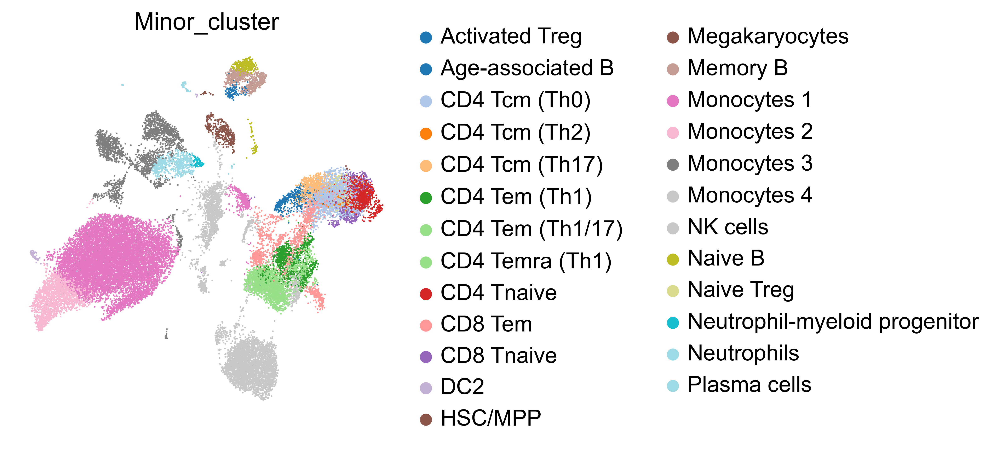

In [15]:
sc.set_figure_params(dpi=300, color_map = 'viridis_r', transparent=False, frameon=False)

sc.pl.umap(adata_MC, color = ['Minor_cluster'], save='_overall', palette = 'tab20')

meta NOT subset; don't know how to subset; dropped


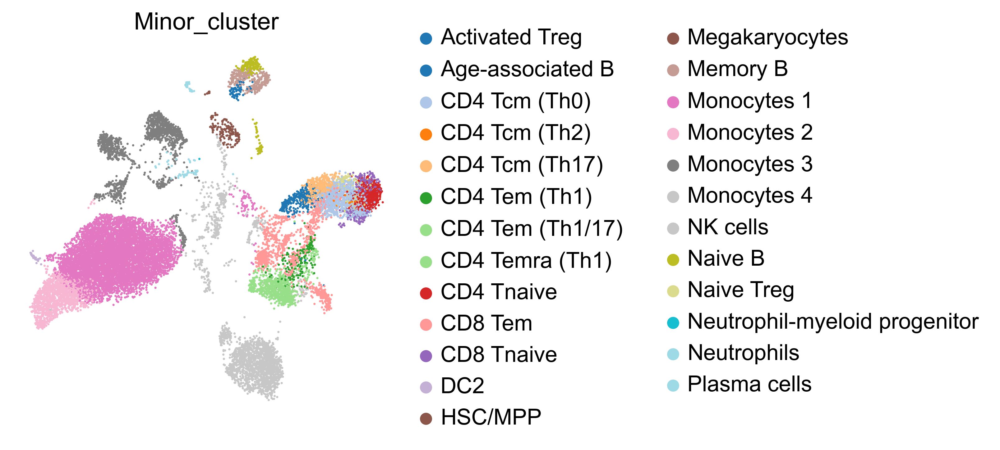

In [16]:
sc.set_figure_params(dpi=200, color_map = 'viridis_r', transparent=False, frameon=False)

sc.pl.umap(adata_MC_MC, color = ['Minor_cluster'], save='_overall_MC', palette = 'tab20')

meta NOT subset; don't know how to subset; dropped


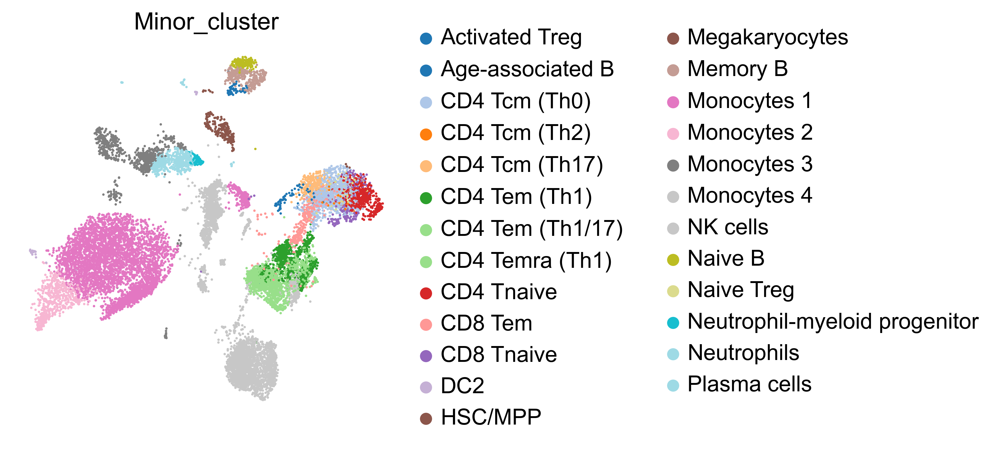

In [17]:
sc.set_figure_params(dpi=200, color_map = 'viridis_r', transparent=False, frameon=False)

sc.pl.umap(adata_MC_AC, color = ['Minor_cluster'], save='_overall_AC', palette = 'tab20')

In [25]:
num_tot_cells = adata_MC.obs.groupby(['Sample']).count()
num_tot_cells = dict(zip(num_tot_cells.index, num_tot_cells.initial_size_spliced))
num_tot_cells

{'Patient_1_After_crisis': 3899,
 'Patient_1_MG_crisis': 8765,
 'Patient_2_After_crisis': 11564,
 'Patient_2_MG_crisis': 9349}

In [26]:
cell_type_counts = adata_MC.obs.groupby(['Sample', 'Phenotype','Minor_cluster']).count()
cell_type_counts = cell_type_counts[cell_type_counts.sum(axis = 1) > 0].reset_index()
cell_type_counts = cell_type_counts[cell_type_counts.columns[0:4]]
cell_type_counts['total_cells'] = cell_type_counts.Sample.map(num_tot_cells).astype(int)
cell_type_counts['frequency'] = cell_type_counts.initial_size_spliced / cell_type_counts.total_cells

cell_type_counts

,Sample,Phenotype,Minor_cluster,initial_size_spliced,total_cells,frequency
0,Patient_1_After_crisis,After_crisis,Activated Treg,9,3899,0.002308
1,Patient_1_After_crisis,After_crisis,Age-associated B,43,3899,0.011028
2,Patient_1_After_crisis,After_crisis,CD4 Tcm (Th0),147,3899,0.037702
3,Patient_1_After_crisis,After_crisis,CD4 Tcm (Th17),2,3899,0.000513
4,Patient_1_After_crisis,After_crisis,CD4 Tem (Th1),492,3899,0.126186
...,...,...,...,...,...,...
91,Patient_2_MG_crisis,MG_crisis,NK cells,1025,9349,0.109637
92,Patient_2_MG_crisis,MG_crisis,Naive B,12,9349,0.001284
93,Patient_2_MG_crisis,MG_crisis,Naive Treg,116,9349,0.012408
94,Patient_2_MG_crisis,MG_crisis,Neutrophils,21,9349,0.002246


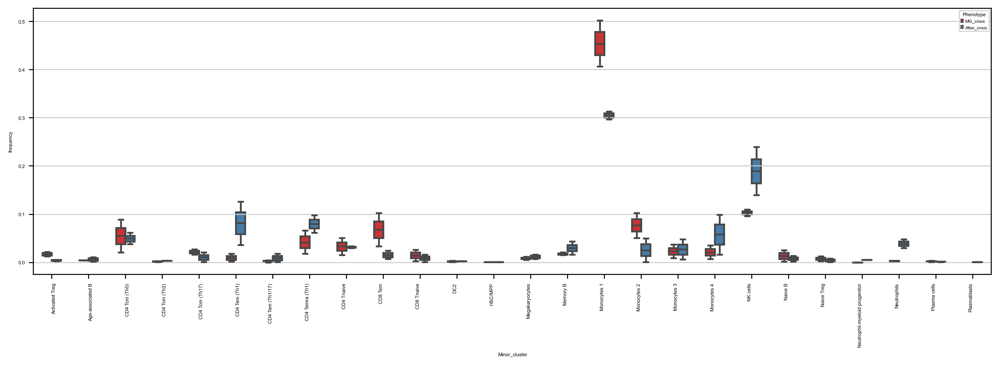

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize = (14,4))
plt.set_cmap('Set1')
plt.xticks(rotation = 90, rotation_mode = 'anchor', ha = 'right')

ax = sns.boxplot(data = cell_type_counts, x = 'Minor_cluster', y = 'frequency', hue = 'Phenotype', width = 0.5 , hue_order= ['MG_crisis', 'After_crisis'], palette="Set1")

#plt.show()
#plt.savefig('example_custom_text_annot.png', dpi=300, bbox_inches='tight')
plt.savefig('cell propotion.pdf', bbox_inches='tight')

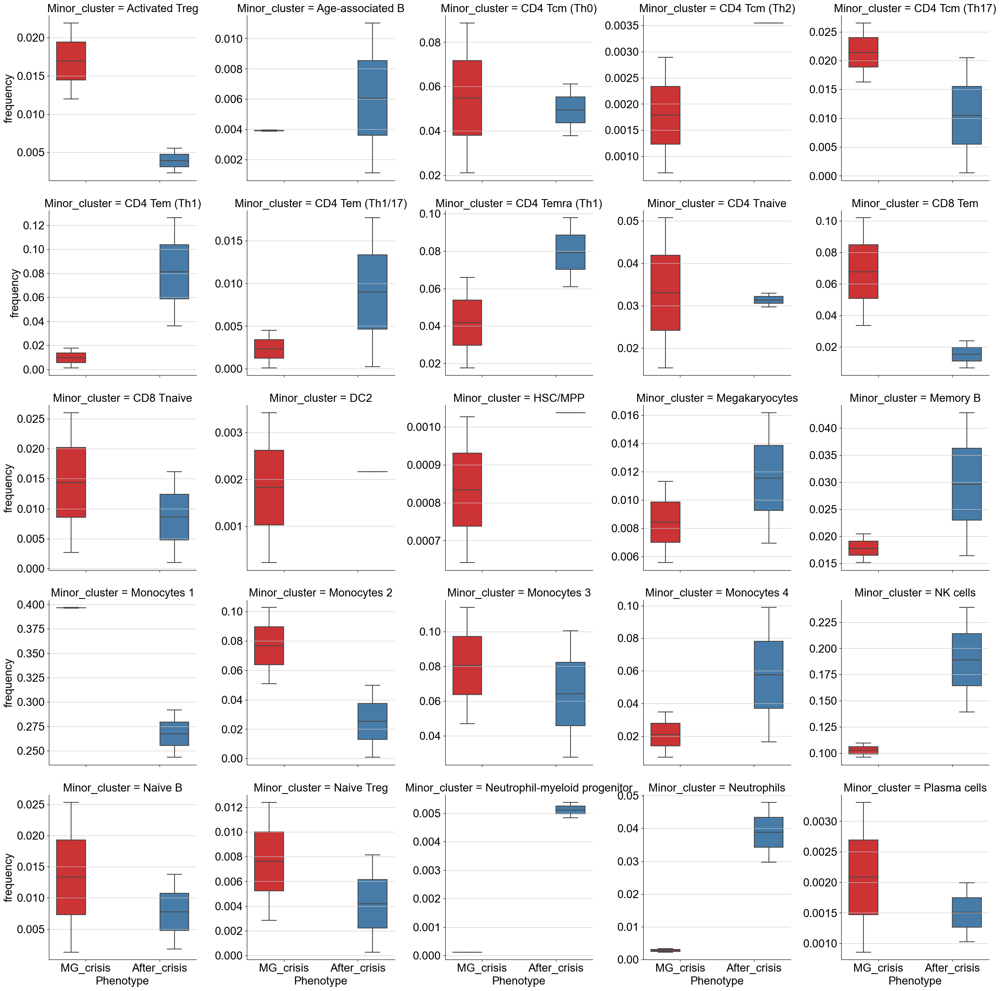

In [27]:
sc.set_figure_params(dpi=50, color_map = 'Set1', transparent=True, frameon=False, fontsize=20,) # fontsize=8, figsize= [8, 4]

sns.catplot(
    data=cell_type_counts, x='Phenotype', y='frequency', order=['MG_crisis', 'After_crisis'],
    col='Minor_cluster', kind='box', col_wrap=5, hue = 'Phenotype', hue_order= ['MG_crisis', 'After_crisis'], sharey=False , palette="Set1"
)

## Overview RNA-veolicity (Sevelo)

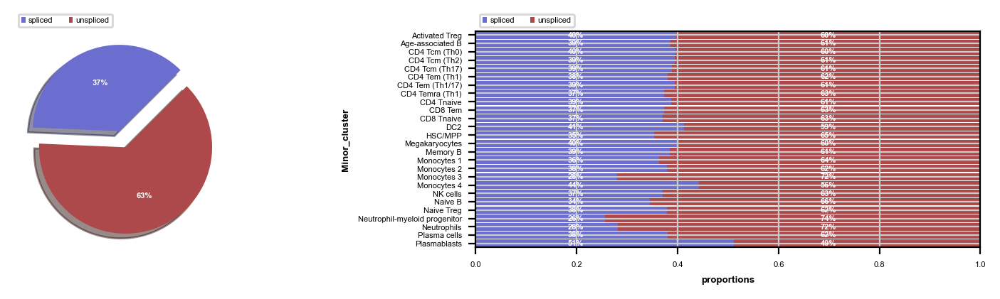

In [15]:
scv.pl.proportions(adata_MC, fontsize=4, groupby='Minor_cluster') # donor_id, Phenotype

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:19) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:08) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:55) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 12/16 cores)
or disable the progress bar using `show_progress_bar=False`.
    finished (0:01:11) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
computing velocity embedding
    finished (0:00:07) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


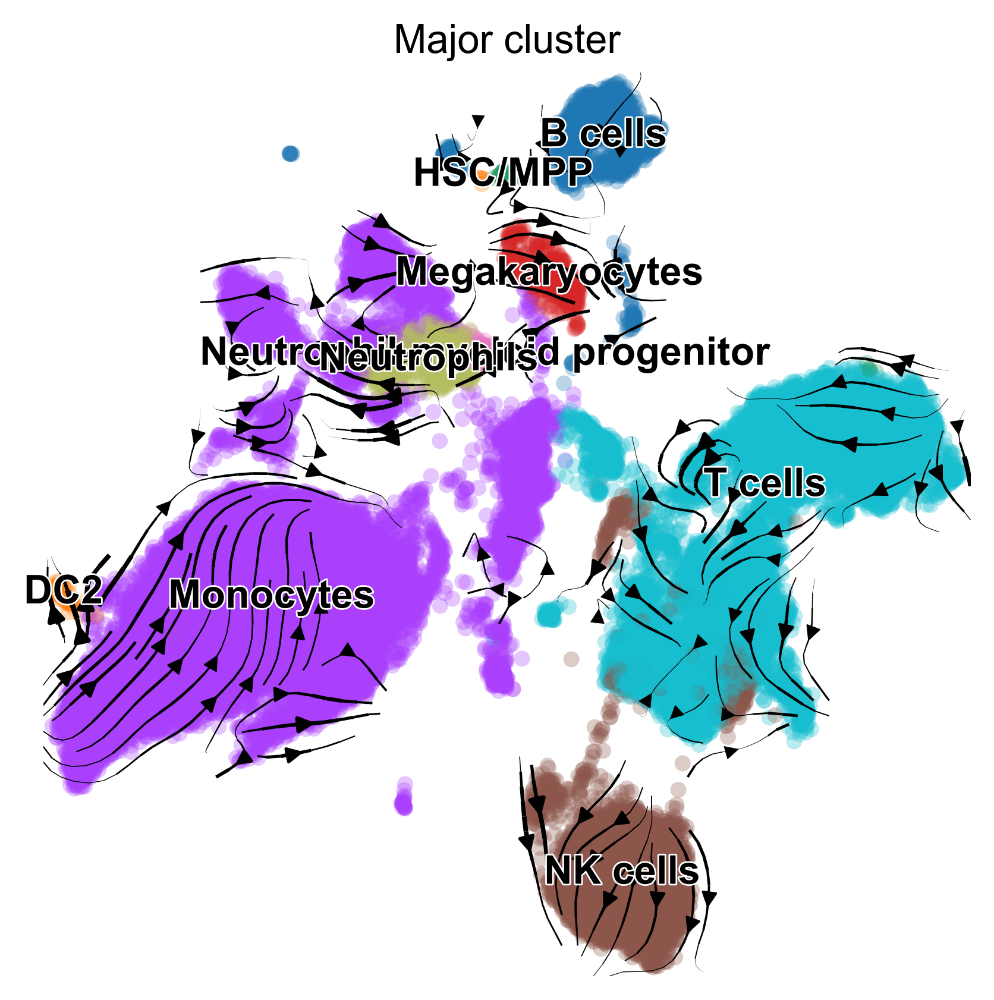

In [16]:
# Sevelo default model

scv.pp.moments(adata_MC, n_pcs=30, n_neighbors=30)
scv.tl.velocity(adata_MC, n_jobs=12)
scv.tl.velocity_graph(adata_MC, n_jobs=12)
scv.set_figure_params(dpi=200, figsize=[5,5], color_map='Set1') #viridis
scv.pl.velocity_embedding_stream(adata_MC, basis='umap', color='Major_cluster')

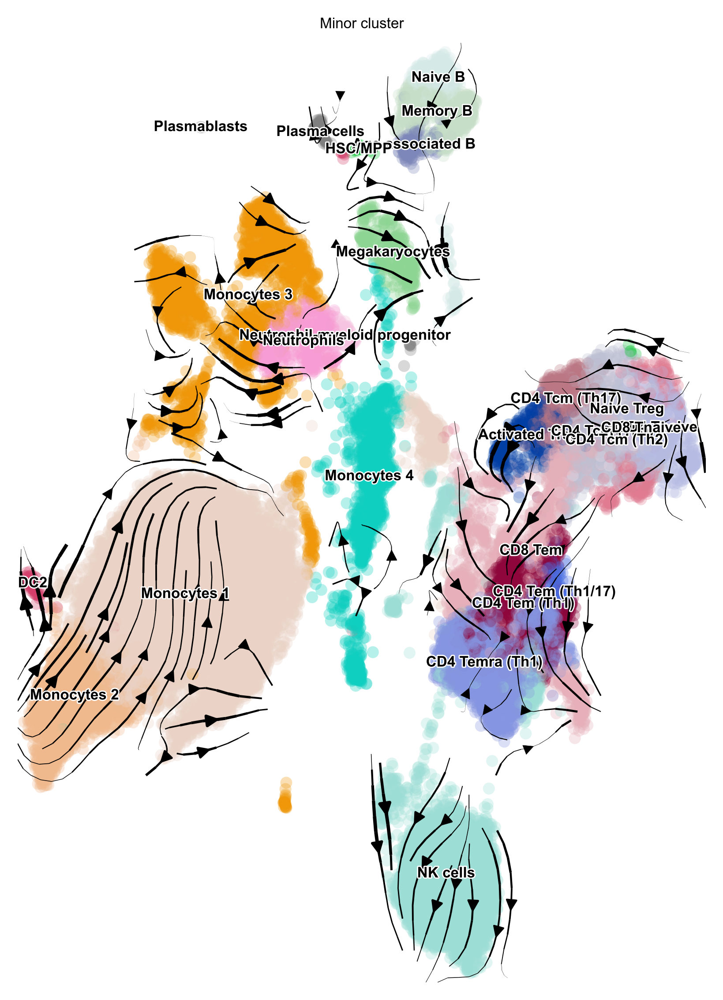

In [18]:
scv.set_figure_params(dpi=200, figsize=[5,7], fontsize=6)

scv.pl.velocity_embedding_stream(adata_MC, basis='umap', color='Minor_cluster')

## Overall pathway scoring

In [3]:
# Interferon_score
Interferon_set = ['BAX', 'IFI6', 'IFIT3', 'IFITM1', 'IFITM3', 'IFNAR1', 'IFNGR1', 'IFNGR2']

# Neutrophils_score
Inflammasome_set = ['CASP1', 'CASP8', 'CTSB', 'MYD88', 'NAIP', 'NEK7', 'NFKB1', 'NLRP1', 'NLRP3', 'TLR4', 'NOD2'] # PPBP = CXCL7

sc.tl.score_genes(adata_MC, Interferon_set, score_name = 'Interferon_score')
sc.tl.score_genes(adata_MC, Inflammasome_set, score_name = 'Inflammasome_score')

scores = ['Interferon_score', 'Inflammasome_score']
df = sc.get.obs_df(adata_MC, scores + ['Minor_cluster','Phenotype', 'donor_id'], use_raw=False)
df2 = df.melt(id_vars=["Minor_cluster",'Phenotype', 'donor_id'], value_vars=scores)


Phenotype_order = ['MG_crisis', 'After_crisis']

#df2["Minor_cluster"] = df2["Minor_cluster"].cat.set_categories(Minor_cluster_order, ordered=True)
df2["Phenotype"] = df2["Phenotype"].cat.set_categories(Phenotype_order, ordered=True)

df2

,Minor_cluster,Phenotype,donor_id,variable,value
0,Monocytes 1,MG_crisis,Patient_1,Interferon_score,0.229863
1,Monocytes 2,MG_crisis,Patient_1,Interferon_score,0.535001
2,Monocytes 1,MG_crisis,Patient_1,Interferon_score,0.640693
3,NK cells,MG_crisis,Patient_1,Interferon_score,0.962821
4,Monocytes 1,MG_crisis,Patient_1,Interferon_score,0.447169
...,...,...,...,...,...
67149,NK cells,After_crisis,Patient_2,Inflammasome_score,-0.099540
67150,Megakaryocytes,After_crisis,Patient_2,Inflammasome_score,-0.129420
67151,Monocytes 1,After_crisis,Patient_2,Inflammasome_score,0.044765
67152,Monocytes 1,After_crisis,Patient_2,Inflammasome_score,0.411296


meta NOT subset; don't know how to subset; dropped


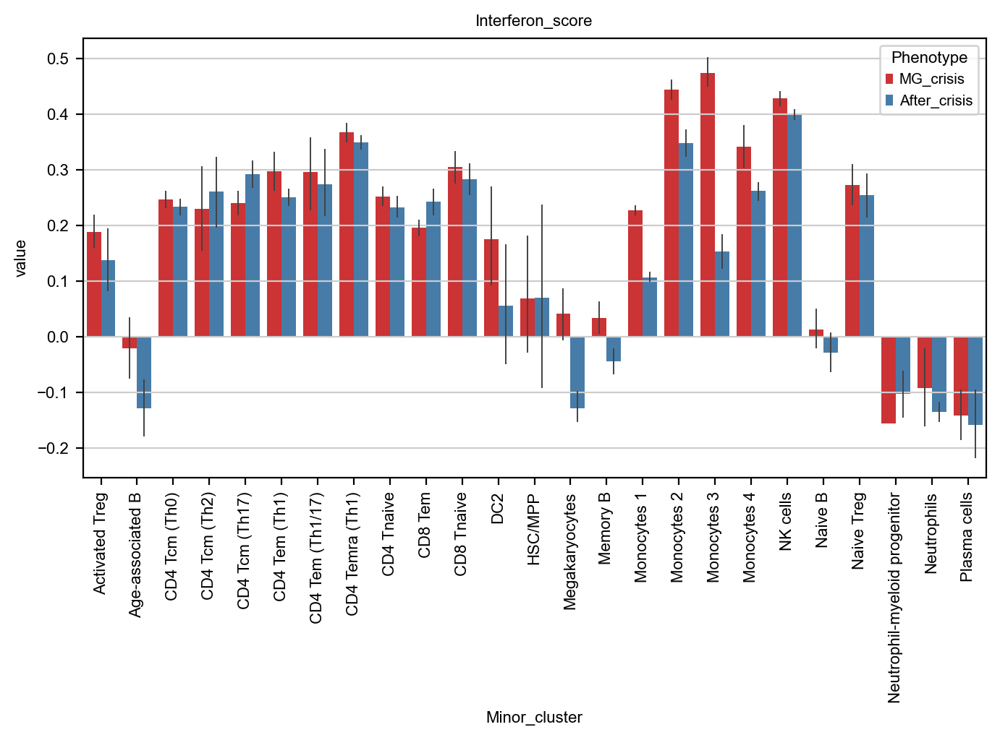

In [38]:
sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [8, 4])

#sns.barplot(data=df2[(df2['variable'] == 'SRSF1') & (df2['Donor'] == 'patient_3') ], x="Minor_cluster", y="value", hue="Phenotype", errwidth=0.7)
sns.barplot(data=df2[(df2['variable'] == 'Interferon_score')], x="Minor_cluster", y="value", hue="Phenotype",hue_order= ['MG_crisis', 'After_crisis'], palette="Set1", errwidth=0.7).set(title='Interferon_score')

plt.xticks(rotation=90)
plt.savefig('Interferon_score.pdf')

meta NOT subset; don't know how to subset; dropped


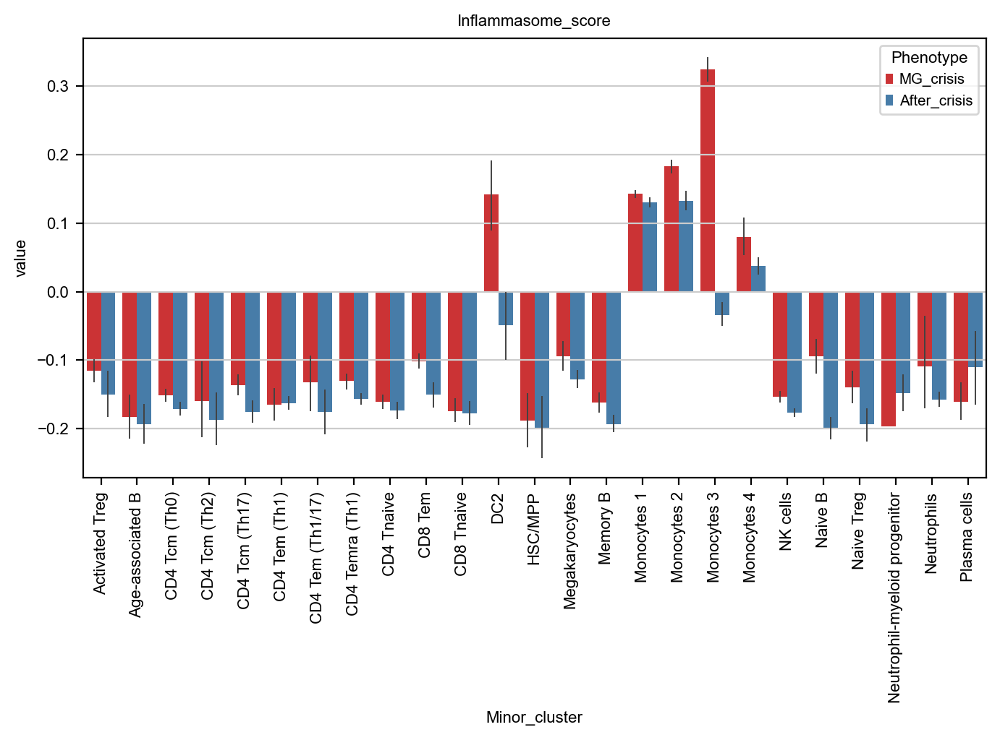

In [4]:
sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [8, 4])

#sns.barplot(data=df2[(df2['variable'] == 'SRSF1') & (df2['Donor'] == 'patient_3') ], x="Minor_cluster", y="value", hue="Phenotype", errwidth=0.7)
sns.barplot(data=df2[(df2['variable'] == 'Inflammasome_score')], x="Minor_cluster", y="value", hue="Phenotype",hue_order= ['MG_crisis', 'After_crisis'], palette="Set1", errwidth=0.7).set(title='Inflammasome_score')

plt.xticks(rotation=90)
plt.savefig('Inflammasome_score.pdf')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24]),
 [Text(0, 0, 'Activated Treg'),
  Text(1, 0, 'Age-associated B'),
  Text(2, 0, 'CD4 Tcm (Th0)'),
  Text(3, 0, 'CD4 Tcm (Th2)'),
  Text(4, 0, 'CD4 Tcm (Th17)'),
  Text(5, 0, 'CD4 Tem (Th1)'),
  Text(6, 0, 'CD4 Tem (Th1/17)'),
  Text(7, 0, 'CD4 Temra (Th1)'),
  Text(8, 0, 'CD4 Tnaive'),
  Text(9, 0, 'CD8 Tem'),
  Text(10, 0, 'CD8 Tnaive'),
  Text(11, 0, 'DC2'),
  Text(12, 0, 'HSC/MPP'),
  Text(13, 0, 'Megakaryocytes'),
  Text(14, 0, 'Memory B'),
  Text(15, 0, 'Monocytes 1'),
  Text(16, 0, 'Monocytes 2'),
  Text(17, 0, 'Monocytes 3'),
  Text(18, 0, 'Monocytes 4'),
  Text(19, 0, 'NK cells'),
  Text(20, 0, 'Naive B'),
  Text(21, 0, 'Naive Treg'),
  Text(22, 0, 'Neutrophil-myeloid progenitor'),
  Text(23, 0, 'Neutrophils'),
  Text(24, 0, 'Plasma cells')])

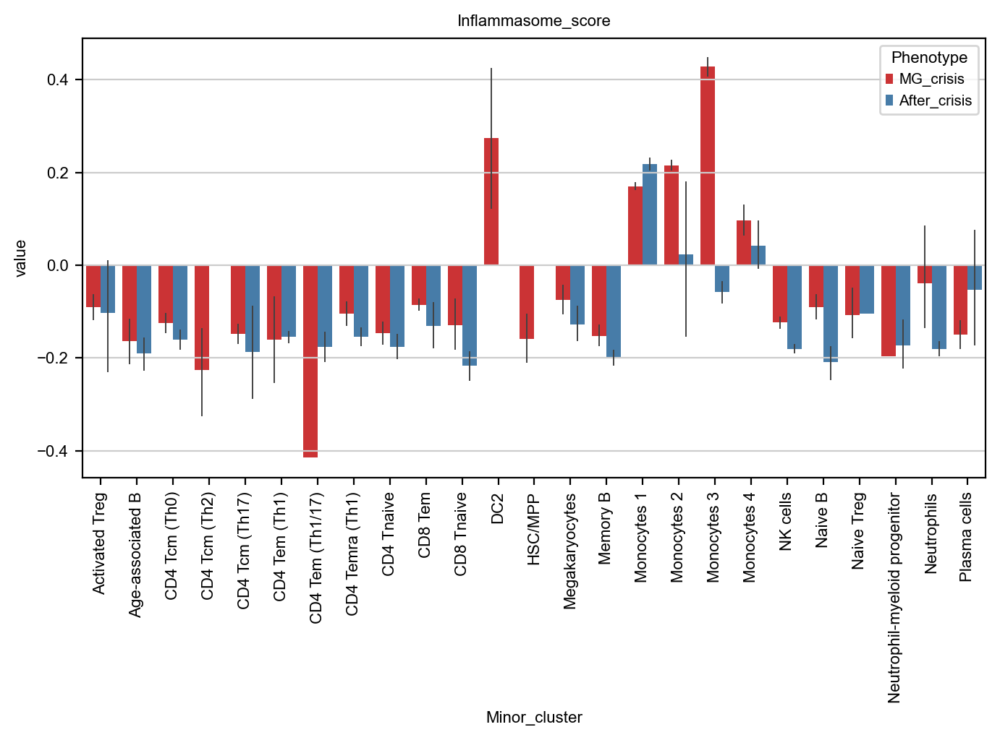

In [8]:
# Patient 1 Inflammasome_score

sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [8, 4])

#sns.barplot(data=df2[(df2['variable'] == 'SRSF1') & (df2['Donor'] == 'patient_3') ], x="Minor_cluster", y="value", hue="Phenotype", errwidth=0.7)
sns.barplot(data=df2[(df2['variable'] == 'Inflammasome_score') & (df2['donor_id'] == 'Patient_1')], x="Minor_cluster", y="value", hue="Phenotype",hue_order= ['MG_crisis', 'After_crisis'], palette="Set1", errwidth=0.7).set(title='Inflammasome_score')

plt.xticks(rotation=90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24]),
 [Text(0, 0, 'Activated Treg'),
  Text(1, 0, 'Age-associated B'),
  Text(2, 0, 'CD4 Tcm (Th0)'),
  Text(3, 0, 'CD4 Tcm (Th2)'),
  Text(4, 0, 'CD4 Tcm (Th17)'),
  Text(5, 0, 'CD4 Tem (Th1)'),
  Text(6, 0, 'CD4 Tem (Th1/17)'),
  Text(7, 0, 'CD4 Temra (Th1)'),
  Text(8, 0, 'CD4 Tnaive'),
  Text(9, 0, 'CD8 Tem'),
  Text(10, 0, 'CD8 Tnaive'),
  Text(11, 0, 'DC2'),
  Text(12, 0, 'HSC/MPP'),
  Text(13, 0, 'Megakaryocytes'),
  Text(14, 0, 'Memory B'),
  Text(15, 0, 'Monocytes 1'),
  Text(16, 0, 'Monocytes 2'),
  Text(17, 0, 'Monocytes 3'),
  Text(18, 0, 'Monocytes 4'),
  Text(19, 0, 'NK cells'),
  Text(20, 0, 'Naive B'),
  Text(21, 0, 'Naive Treg'),
  Text(22, 0, 'Neutrophil-myeloid progenitor'),
  Text(23, 0, 'Neutrophils'),
  Text(24, 0, 'Plasma cells')])

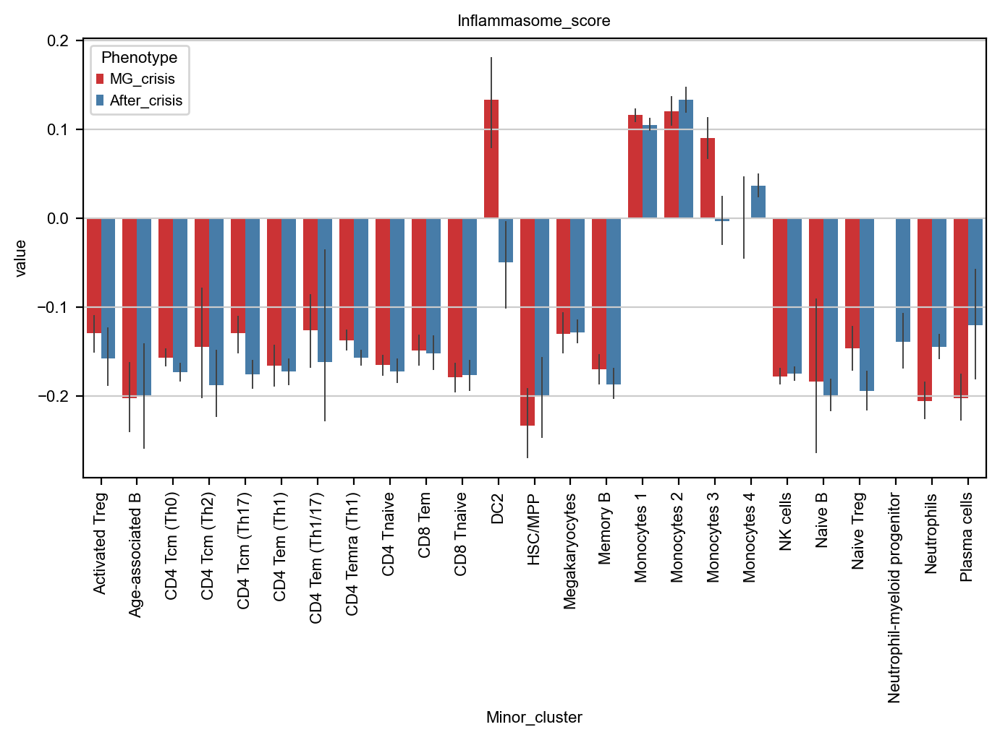

In [9]:
# Patient 2 Inflammasome_score

sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [8, 4])

#sns.barplot(data=df2[(df2['variable'] == 'SRSF1') & (df2['Donor'] == 'patient_3') ], x="Minor_cluster", y="value", hue="Phenotype", errwidth=0.7)
sns.barplot(data=df2[(df2['variable'] == 'Inflammasome_score') & (df2['donor_id'] == 'Patient_2')], x="Minor_cluster", y="value", hue="Phenotype",hue_order= ['MG_crisis', 'After_crisis'], palette="Set1", errwidth=0.7).set(title='Inflammasome_score')

plt.xticks(rotation=90)

## Overall gene expression

In [8]:
adata_MC.obs['Minor_cluster'].unique().tolist()

['Monocytes 1',
 'Monocytes 2',
 'NK cells',
 'CD8 Tem',
 'Monocytes 3',
 'Megakaryocytes',
 'CD4 Temra (Th1)',
 'CD4 Tcm (Th0)',
 'CD4 Tcm (Th17)',
 'Activated Treg',
 'Naive B',
 'CD4 Tnaive',
 'Plasma cells',
 'CD8 Tnaive',
 'Monocytes 4',
 'Naive Treg',
 'Memory B',
 'CD4 Tcm (Th2)',
 'Age-associated B',
 'Neutrophils',
 'DC2',
 'CD4 Tem (Th1)',
 'Neutrophil-myeloid progenitor',
 'HSC/MPP',
 'CD4 Tem (Th1/17)']

In [3]:
genelist = ['EOMES','CD244', 'PDCD1', 'TIGIT', 'CD160', 'CXCL3', 'CXCL2', 'CXCL8', 'C5', 'LTB4R', 'IL1B', 'IFNG', 'IL10', 'IL4', 'IL21', 'RNASE2', 'CXCR2',  'TNF', 'LTA', 'FCGR3B','CSF3R', 'TREM1', 'TNFRSF10C', 'CXCR2']
df = sc.get.obs_df(adata_MC, genelist + ['Minor_cluster','Phenotype', 'donor_id'], use_raw=False)
df2 = df.melt(id_vars=["Minor_cluster",'Phenotype', 'donor_id'], value_vars=genelist)

Minor_cluster_order = ['CD4 Tnaive', 'CD4 Tcm (Th0)', 'CD4 Tcm (Th2)', 'CD4 Tcm (Th17)', 'CD4 Tem (Th1)', 'CD4 Tem (Th1/17)', 'CD4 Temra (Th1)', 'CD8 Tnaive', 'CD8 Tem', 'Naive Treg', 'Activated Treg', 'Naive B', 'Memory B','Age-associated B', 'Plasmablasts', 'Plasma cells', 'NK cells', 'Monocytes 1', 'Monocytes 2', 'Monocytes 3', 'Monocytes 4', 'Neutrophil-myeloid progenitor', 'Neutrophils','Megakaryocytes', 'DC2', 'HSC/MPP']


['CD4 Tnaive', 'CD4 Tcm (Th0)','CD4 Tcm (Th2)', 'CD4 Tcm (Th17)', 'CD4 Tem (Th1)','CD4 Tem (Th1/17)', 'CD4 Temra (Th1)', 'Naive Treg', 'Activated Treg', 'CD8 Tnaive', 'CD8 Tem',
 'CD8 Temra', 'NKT', 'Naive B', 'Memory B', 'Plasma cells', 'Age-associated B','Monocytes 1', 'Monocytes 2', 'Monocytes 3', 'Monocytes 4', 'NK', 'Neutrophils', 'DC2', 'Megakaryocytes/platelets',
]
Phenotype_order = ['MG_crisis', 'After_crisis']

df2["Minor_cluster"] = df2["Minor_cluster"].cat.set_categories(Minor_cluster_order, ordered=True)
df2["Phenotype"] = df2["Phenotype"].cat.set_categories(Phenotype_order, ordered=True)

df2

,Minor_cluster,Phenotype,donor_id,variable,value
0,Monocytes 1,MG_crisis,Patient_1,EOMES,0.0
1,Monocytes 2,MG_crisis,Patient_1,EOMES,0.0
2,Monocytes 1,MG_crisis,Patient_1,EOMES,0.0
3,NK cells,MG_crisis,Patient_1,EOMES,0.0
4,Monocytes 1,MG_crisis,Patient_1,EOMES,0.0
...,...,...,...,...,...
805843,NK cells,After_crisis,Patient_2,TNFRSF10C,0.0
805844,Megakaryocytes,After_crisis,Patient_2,TNFRSF10C,0.0
805845,Monocytes 1,After_crisis,Patient_2,TNFRSF10C,0.0
805846,Monocytes 1,After_crisis,Patient_2,TNFRSF10C,0.0


In [10]:
df3 = df2[(df2['variable'] == 'IL1B') & (df2['Minor_cluster'] == 'Monocytes 3')]

df3.groupby(['Phenotype'])['value'].mean()

Phenotype
MG_crisis       0.158130
After_crisis    0.055687
Name: value, dtype: float32

meta NOT subset; don't know how to subset; dropped


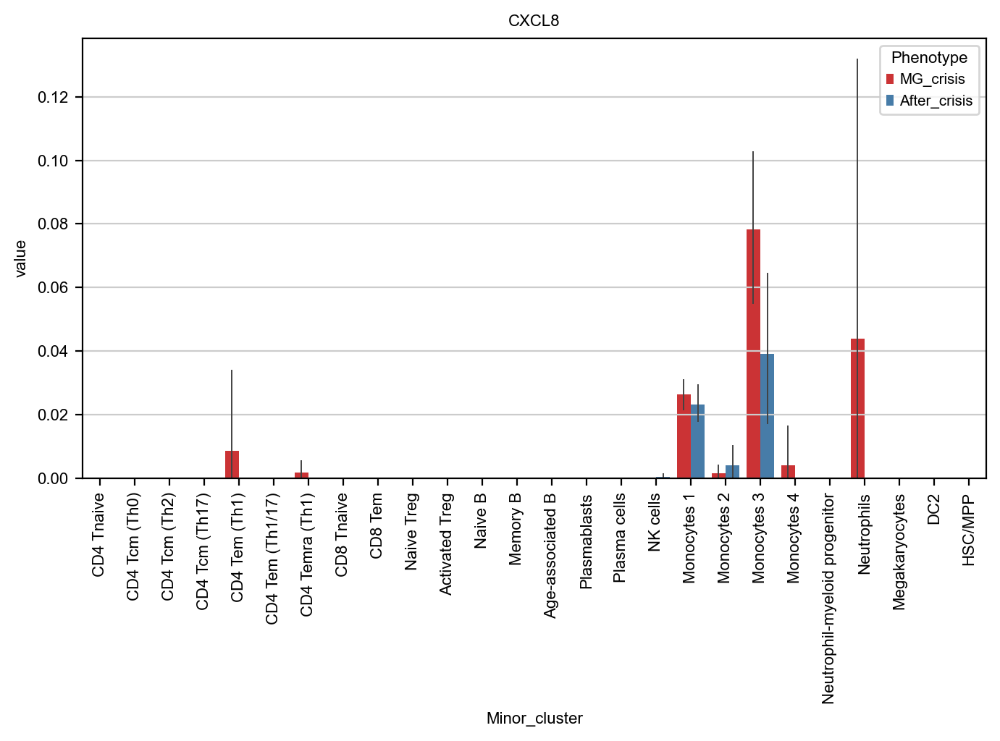

In [29]:
sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [8, 4])

sns.barplot(data=df2[(df2['variable'] == 'CXCL8')], x="Minor_cluster", y="value", hue="Phenotype",hue_order= ['MG_crisis', 'After_crisis'], palette="Set1", errwidth=0.7).set(title='CXCL8')

plt.xticks(rotation=90)
plt.savefig('./figs/CXCL8.pdf')

meta NOT subset; don't know how to subset; dropped


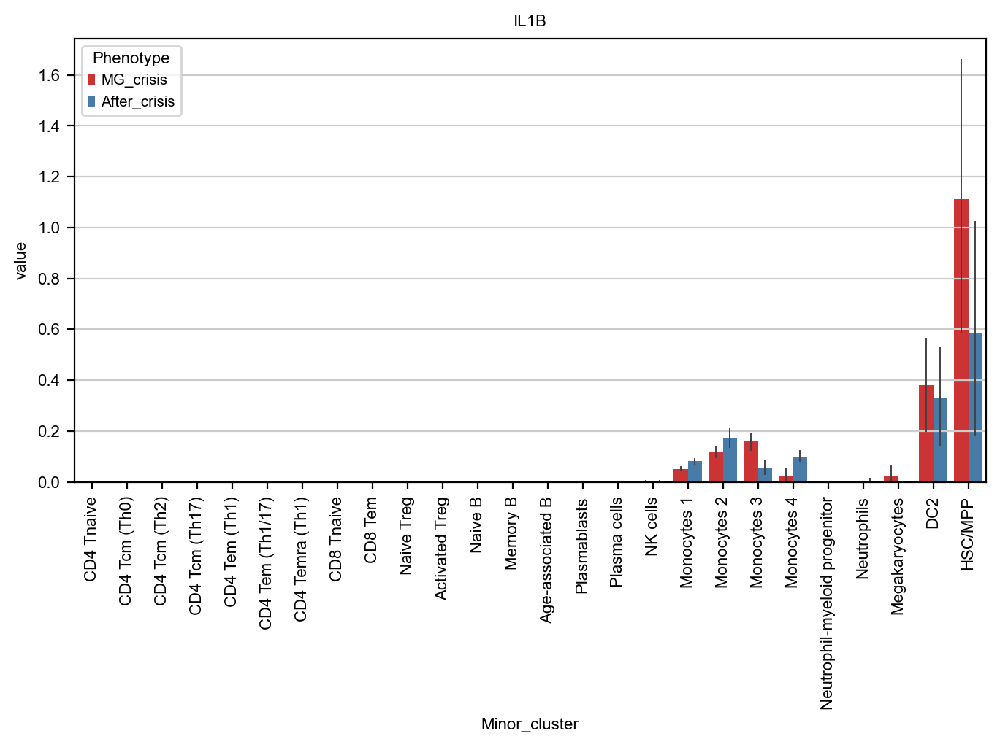

In [32]:
sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [8, 4])

sns.barplot(data=df2[(df2['variable'] == 'IL1B')], x="Minor_cluster", y="value", hue="Phenotype",hue_order= ['MG_crisis', 'After_crisis'], palette="Set1", errwidth=0.7).set(title='IL1B')

plt.xticks(rotation=90)
plt.savefig('./figs/IL1B.pdf')

meta NOT subset; don't know how to subset; dropped


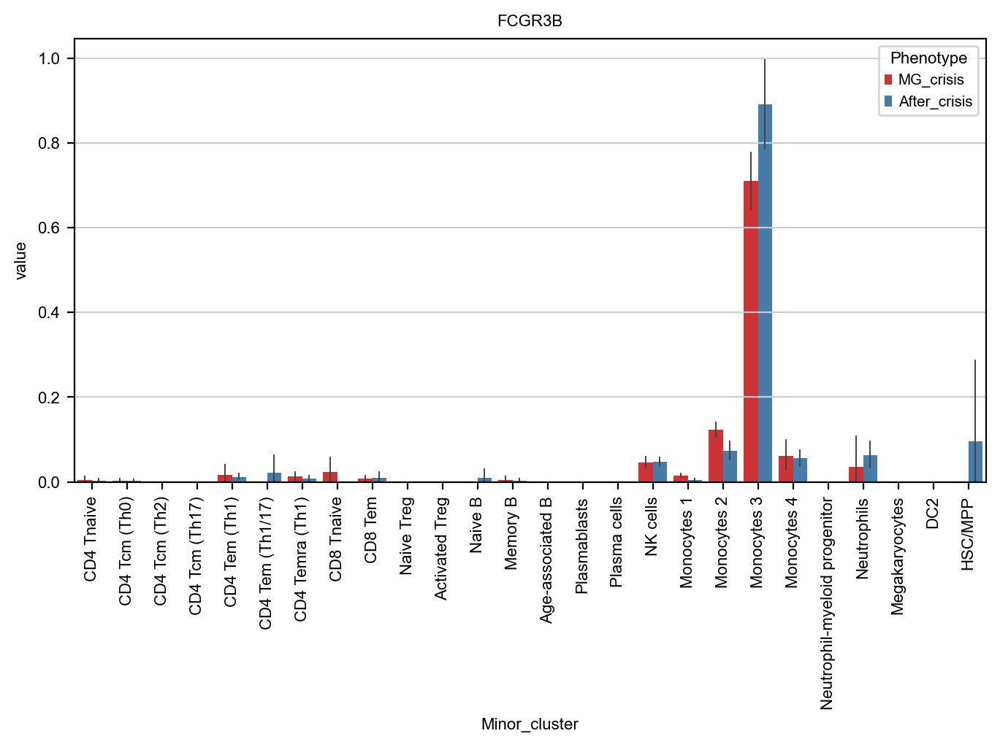

In [30]:
sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [8, 4])

sns.barplot(data=df2[(df2['variable'] == 'FCGR3B')], x="Minor_cluster", y="value", hue="Phenotype",hue_order= ['MG_crisis', 'After_crisis'], palette="Set1", errwidth=0.7).set(title='FCGR3B')

plt.xticks(rotation=90)
plt.savefig('./figs/FCGR3B.pdf')

meta NOT subset; don't know how to subset; dropped


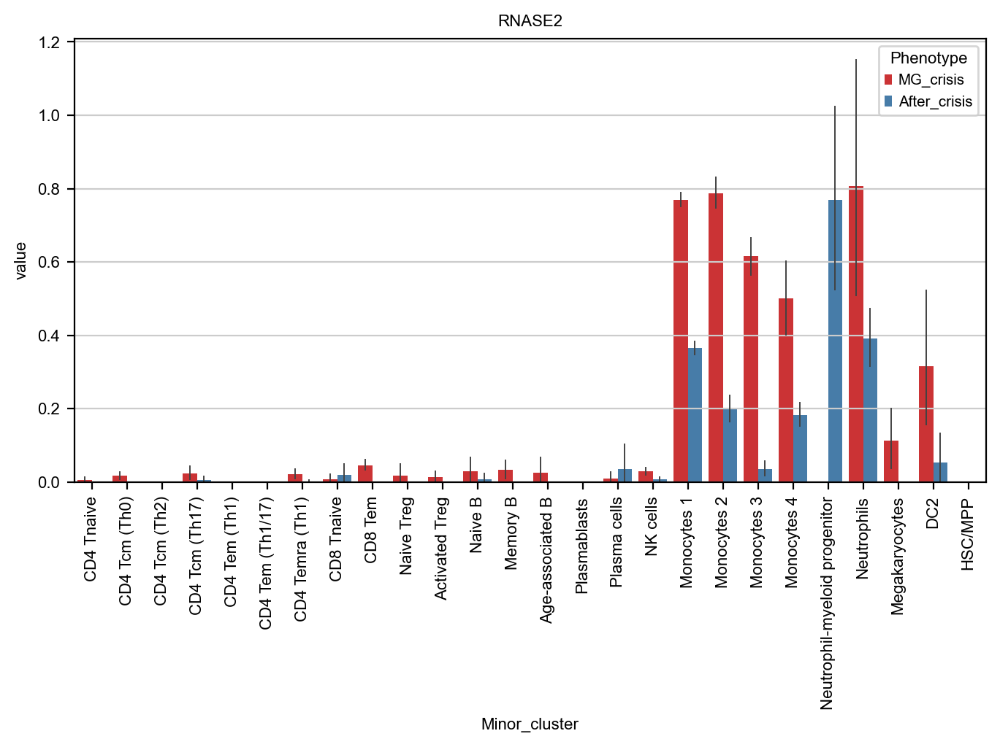

In [31]:
sc.set_figure_params(dpi=100, color_map = 'Set1', transparent=True, frameon=False, fontsize=8, figsize= [8, 4])

sns.barplot(data=df2[(df2['variable'] == 'RNASE2')], x="Minor_cluster", y="value", hue="Phenotype",hue_order= ['MG_crisis', 'After_crisis'], palette="Set1", errwidth=0.7).set(title='RNASE2')

plt.xticks(rotation=90)
plt.savefig('./figs/RNASE2.pdf')

## Cytokines expression dot plot (MC)

In [40]:
adata_MC_MC = adata_MC[adata_MC.obs['Phenotype'] == 'MG_crisis']
adata_MC_MC

View of AnnData object with n_obs × n_vars = 18114 × 19590
    obs: 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'Phenotype', 'donor_id', 'batch', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'predicted_labels_NC2022', 'majority_voting_NC2022', 'predicted_labels_builtin', 'majority_voting_builtin', 'leiden', 'Major_cluster', 'Sample', 'Minor_cluster', 'Major_category', 'T_exhaustion_score', 'T_activation_score', 'Interferon_score', 'Neutrophils_score'
    var: 'gene_ids', 'feature_types', 'genome', 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Major_category_colors', 'Major_cluster_colors', 'Phenotype_colors', 'donor_id_colors', 'leiden', 'log1p', 'majority_voting_NC2022_colors', 'majority_voting_builtin_colors', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs

categories: Activated Treg, Age-associated B, CD4 Tcm (Th0), etc.
var_group_labels: Cytokines (increased in MC), CC chemokines, CXC chemokines


meta NOT subset; don't know how to subset; dropped


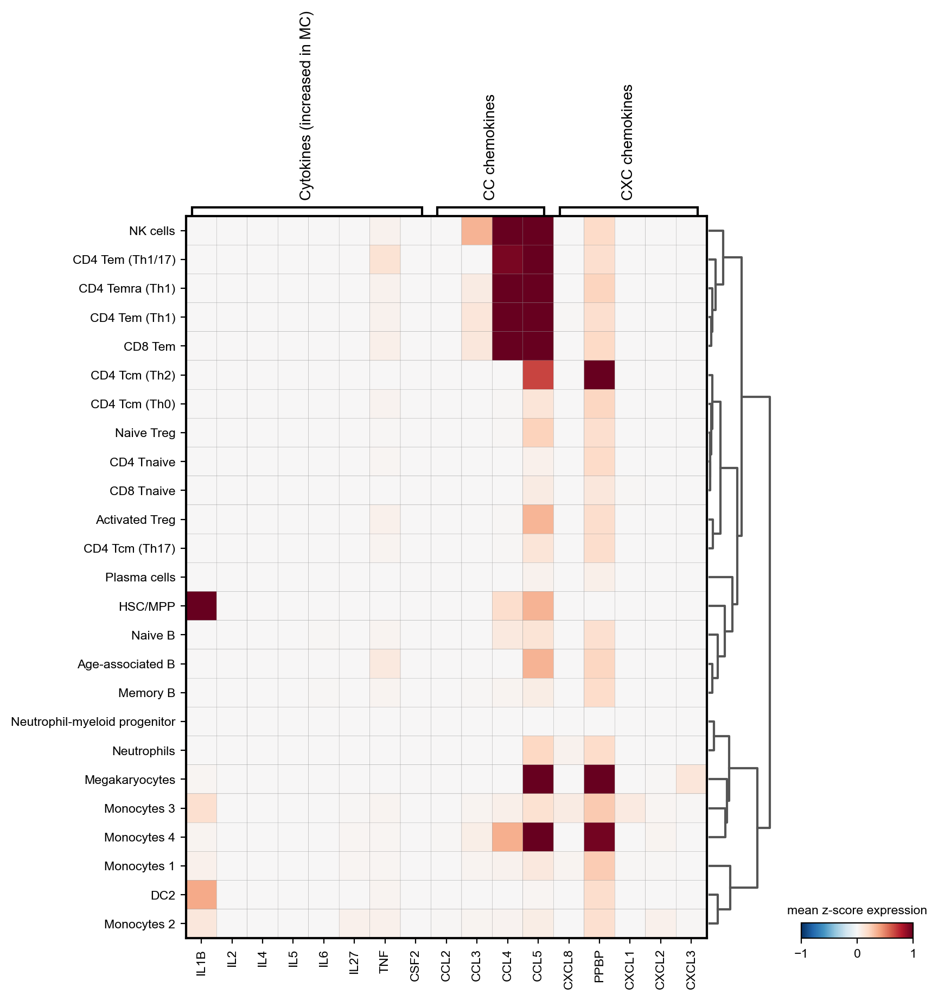

In [41]:
sc.set_figure_params(dpi=100,  transparent=True, frameon=False, fontsize=10)

# PPBP = CXCL7

marker_genes_dict = {
    #'Cytokines': ['IL1B', 'IL2', 'IL4', 'IL5', 'IL6', 'IL12A', 'IL18', 'IL21', 'IL23A', 'IL27', 'IFNG', 'TNF' , 'CSF2'],
    'Cytokines (increased in MC)': ['IL1B', 'IL2', 'IL4', 'IL5', 'IL6',  'IL27',  'TNF' , 'CSF2'],
    'CC chemokines': ['CCL2', 'CCL3', 'CCL4', 'CCL5'],
    'CXC chemokines': ['CXCL8', 'PPBP', 'CXCL1', 'CXCL2', 'CXCL3']
}

sc.pl.matrixplot(adata_MC_MC, marker_genes_dict, groupby='Minor_cluster', dendrogram=True, colorbar_title='mean z-score expression', vmin=-1, vmax=1, cmap='RdBu_r', save='Cytokines expression dot plot')

categories: Activated Treg, Age-associated B, CD4 Tcm (Th0), etc.
var_group_labels: Receptors


meta NOT subset; don't know how to subset; dropped


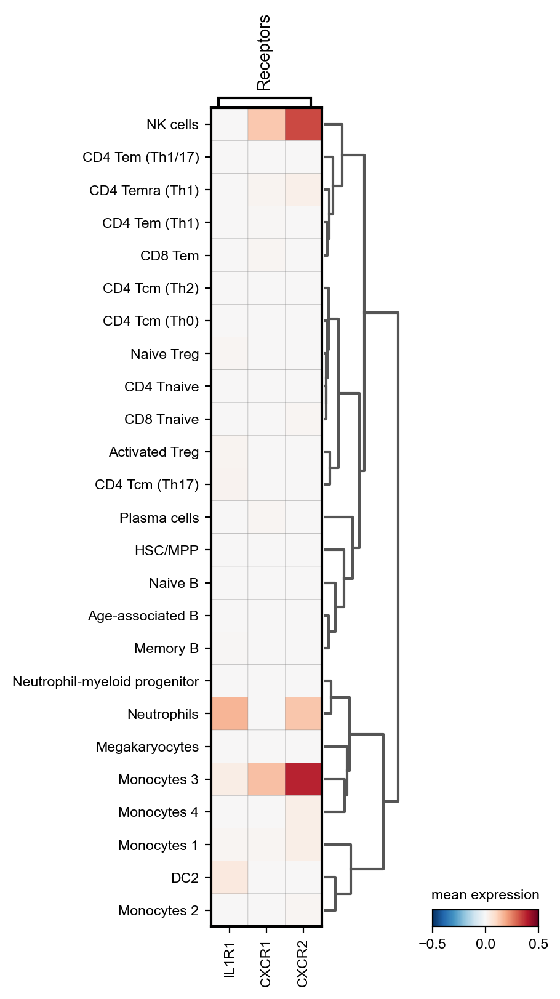

In [42]:
marker_genes_dict = {
    #'Cytokines': ['IL1B', 'IL2', 'IL4', 'IL5', 'IL6', 'IL12A', 'IL18', 'IL21', 'IL23A', 'IL27', 'IFNG', 'TNF' , 'CSF2'],
    'Receptors': ['IL1R1', 'CXCR1', 'CXCR2'],
}

sc.pl.matrixplot(adata_MC_MC, marker_genes_dict, groupby='Minor_cluster', dendrogram=True, colorbar_title='mean expression', vmin=-0.5, vmax=0.5, cmap='RdBu_r', save='Cytokines expression dot plot receptor')